**Heart Disease Prediction Project**

***Introduction***

This project aims to develop a machine learning model to predict the likelihood of heart disease in patients based on their medical attributes. By leveraging a neural network, the model analyzes various health metrics to provide accurate predictions, assisting in early diagnosis and prevention. The project utilizes the UCI Heart Disease dataset, which contains 14 features such as age, cholesterol levels, chest pain type, and other clinical measurements.
Data Source: https://www.kaggle.com/datasets/redwankarimsony/heart-disease-data


***Amar Ahmed***

**Data scientist** | **Machine Learning Developer** | **Computer Vision Researcher**

In [ ]:
!pip install ydata_profiling

In [ ]:
# import library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from ydata_profiling import ProfileReport
from keras.utils import plot_model

# Reading Data
Data = pd.read_csv('heart_disease_uci.csv')
Data.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


# EDA

In [ ]:
# Data Overview
display("Data size:", Data.shape)
print('--------------------------------------------')
display("\n columns:", Data.columns.tolist())
print('--------------------------------------------')
display("\n Data type:", Data.dtypes)
print('--------------------------------------------')


'Data size:'

(920, 16)

--------------------------------------------


'\n columns:'

['id',
 'age',
 'sex',
 'dataset',
 'cp',
 'trestbps',
 'chol',
 'fbs',
 'restecg',
 'thalch',
 'exang',
 'oldpeak',
 'slope',
 'ca',
 'thal',
 'num']

--------------------------------------------


'\n Data type:'

,0
id,int64
age,int64
sex,object
dataset,object
cp,object
trestbps,float64
chol,float64
fbs,object
restecg,object
thalch,float64


--------------------------------------------


In [ ]:
Data.tail()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
915,916,54,Female,VA Long Beach,asymptomatic,127.0,333.0,True,st-t abnormality,154.0,False,0.0,NaN,NaN,NaN,1
916,917,62,Male,VA Long Beach,typical angina,NaN,139.0,False,st-t abnormality,NaN,NaN,NaN,NaN,NaN,NaN,0
917,918,55,Male,VA Long Beach,asymptomatic,122.0,223.0,True,st-t abnormality,100.0,False,0.0,NaN,NaN,fixed defect,2
918,919,58,Male,VA Long Beach,asymptomatic,NaN,385.0,True,lv hypertrophy,NaN,NaN,NaN,NaN,NaN,NaN,0
919,920,62,Male,VA Long Beach,atypical angina,120.0,254.0,False,lv hypertrophy,93.0,True,0.0,NaN,NaN,NaN,1


In [ ]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        920 non-null    int64  
 1   age       920 non-null    int64  
 2   sex       920 non-null    object 
 3   dataset   920 non-null    object 
 4   cp        920 non-null    object 
 5   trestbps  861 non-null    float64
 6   chol      890 non-null    float64
 7   fbs       830 non-null    object 
 8   restecg   918 non-null    object 
 9   thalch    865 non-null    float64
 10  exang     865 non-null    object 
 11  oldpeak   858 non-null    float64
 12  slope     611 non-null    object 
 13  ca        309 non-null    float64
 14  thal      434 non-null    object 
 15  num       920 non-null    int64  
dtypes: float64(5), int64(3), object(8)
memory usage: 115.1+ KB


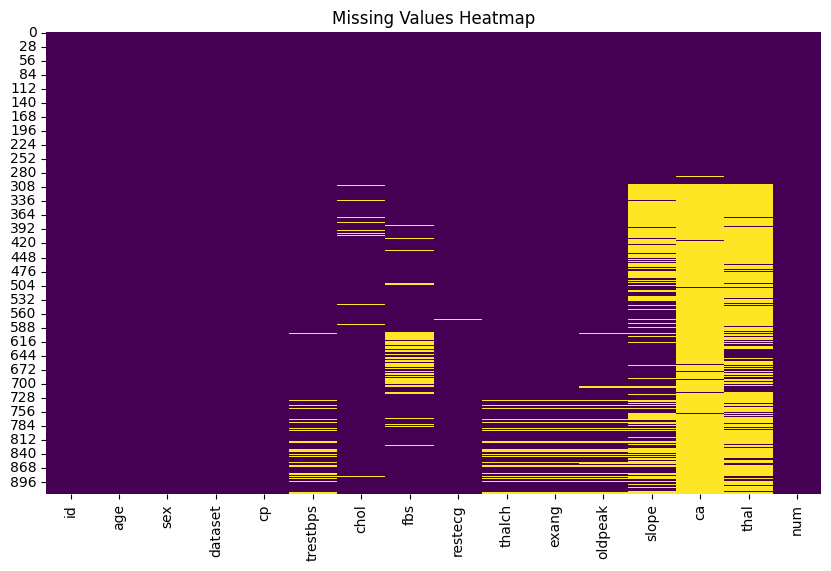

In [ ]:
Data.isnull().sum()

plt.figure(figsize=(10, 6))
sns.heatmap(Data.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

In [ ]:
Data.duplicated().sum()

np.int64(0)

In [ ]:
Data.describe()

,id,age,trestbps,chol,thalch,oldpeak,ca,num
count,920.000000,920.000000,861.000000,890.000000,865.000000,858.000000,309.000000,920.000000
mean,460.500000,53.510870,132.132404,199.130337,137.545665,0.878788,0.676375,0.995652
std,265.725422,9.424685,19.066070,110.780810,25.926276,1.091226,0.935653,1.142693
min,1.000000,28.000000,0.000000,0.000000,60.000000,-2.600000,0.000000,0.000000
25%,230.750000,47.000000,120.000000,175.000000,120.000000,0.000000,0.000000,0.000000
50%,460.500000,54.000000,130.000000,223.000000,140.000000,0.500000,0.000000,1.000000
75%,690.250000,60.000000,140.000000,268.000000,157.000000,1.500000,1.000000,2.000000
max,920.000000,77.000000,200.000000,603.000000,202.000000,6.200000,3.000000,4.000000


In [ ]:
Data.describe(include='object')

,sex,dataset,cp,fbs,restecg,exang,slope,thal
count,920,920,920,830,918,865,611,434
unique,2,4,4,2,3,2,3,3
top,Male,Cleveland,asymptomatic,False,normal,False,flat,normal
freq,726,304,496,692,551,528,345,196


# 🎯 Problem & Solution Summary
While analyzing the data, I noticed that the num column, which indicates disease severity, was highly imbalanced across its multiple classes. Most samples were concentrated in one class, while the others had very few instances. This imbalance could lead to biased model performance and poor generalization.

To address this issue, I simplified the problem from multi-class to binary classification by creating a new target column:

**0 indicates no disease**

**1 indicates any level of disease**

The original num column was then removed to avoid redundancy. After the transformation, the new target distribution became more balanced, allowing the model to learn more effectively and improve prediction accuracy.
# Steps I followed 👇👇👇

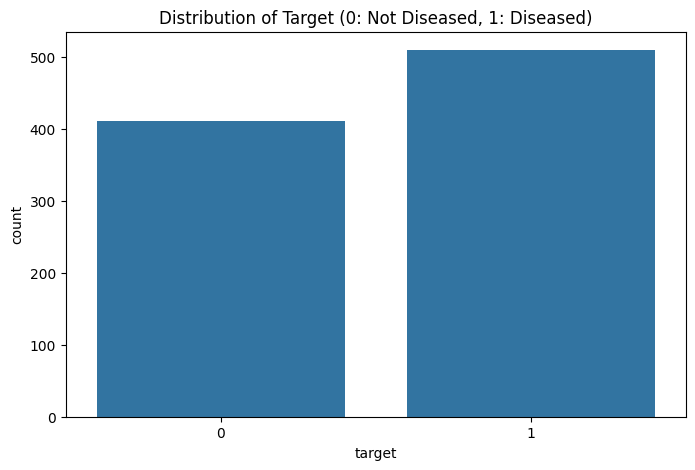

In [ ]:
# Problem Solution
Data['target'] = Data['num'].apply(lambda x: 1 if x > 0 else 0)
Data.drop('num', axis=1, inplace=True)
Data['target'].value_counts()

# Visualize target distribution
plt.figure(figsize=(8, 5))
sns.countplot(x='target', data=Data)
plt.title('Distribution of Target (0: Not Diseased, 1: Diseased)')
plt.show()

In [ ]:
Data['target']

,target
0,0
1,1
2,1
3,0
4,0
...,...
915,1
916,0
917,1
918,0


In [ ]:
# full Report
ProfileReport(Data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 16/16 [00:00<00:00, 23.76it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Validation

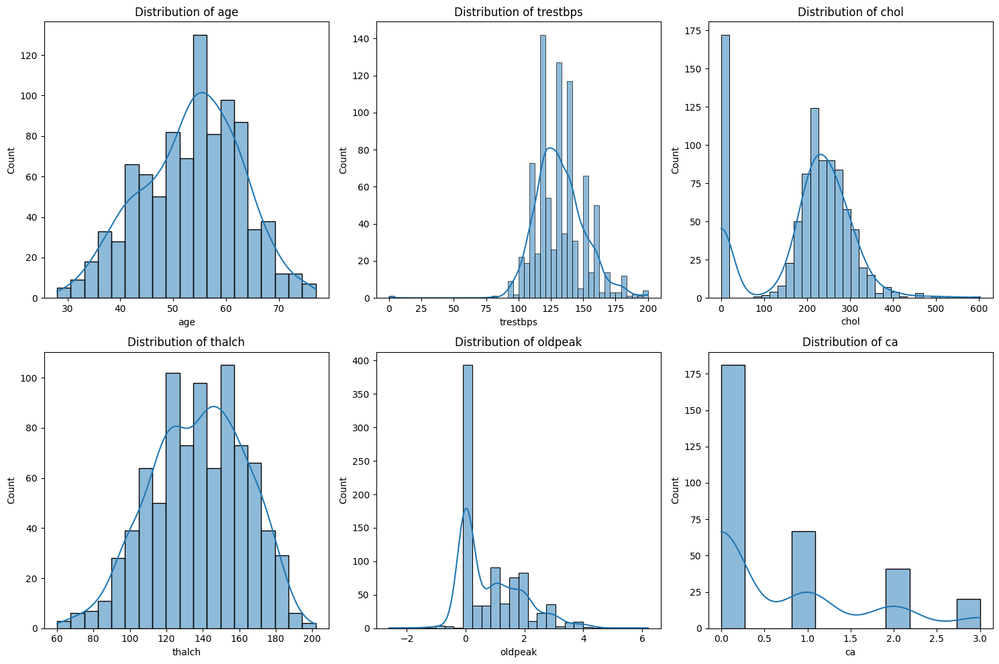

In [ ]:
# numeric columns
numeric_cols = ['age', 'trestbps', 'chol', 'thalch', 'oldpeak', 'ca']

plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(2, 3, i)
    sns.histplot(Data[col], kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

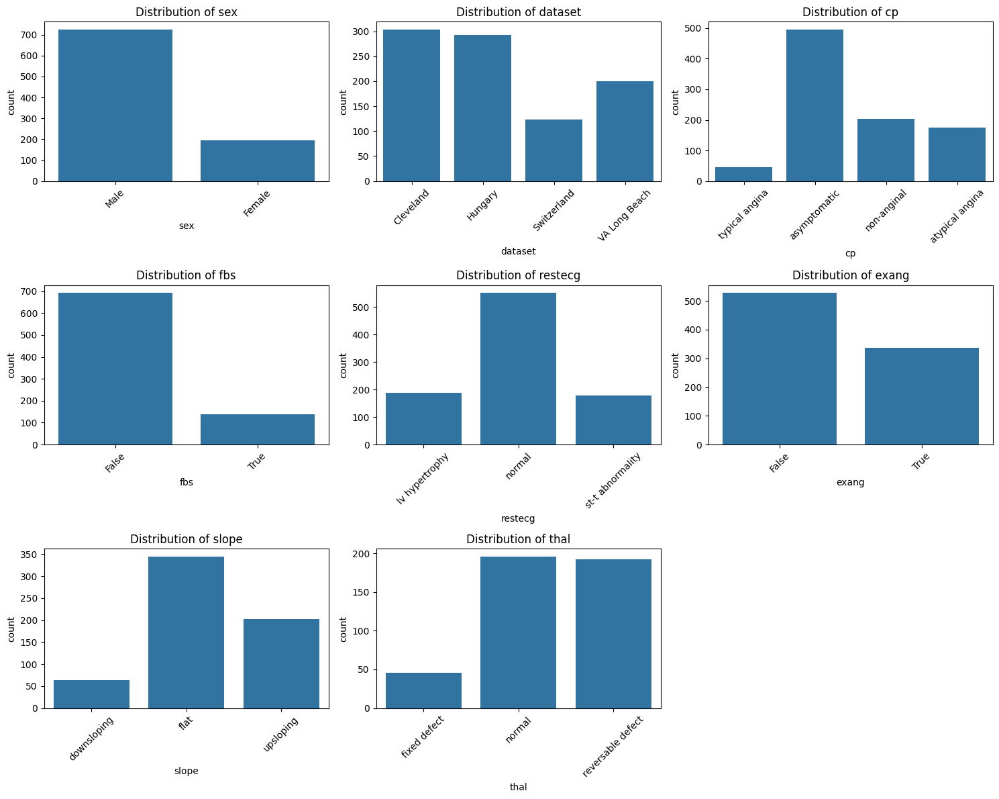

In [ ]:
# categorical columns
categorical_cols = ['sex', 'dataset', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'thal']

plt.figure(figsize=(15, 12))
for i, col in enumerate(categorical_cols, 1):
    plt.subplot(3, 3, i)
    sns.countplot(x=col, data=Data)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

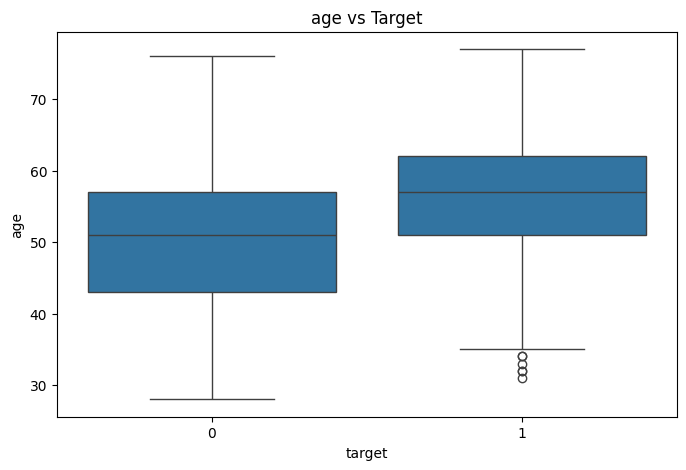

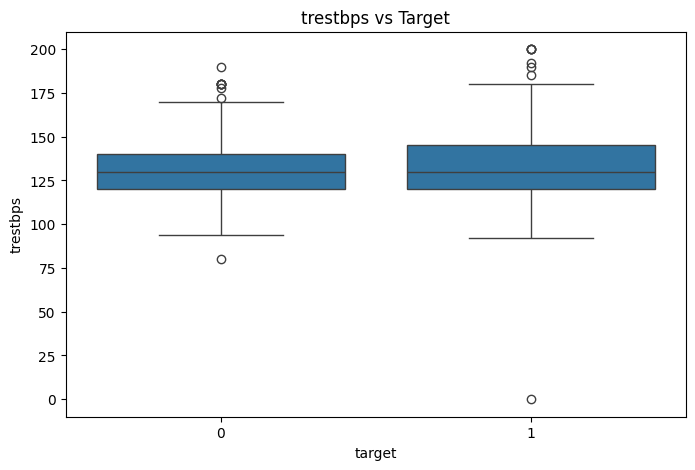

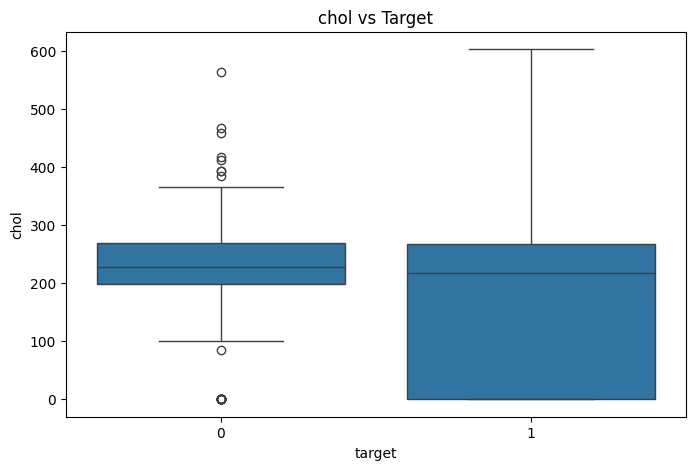

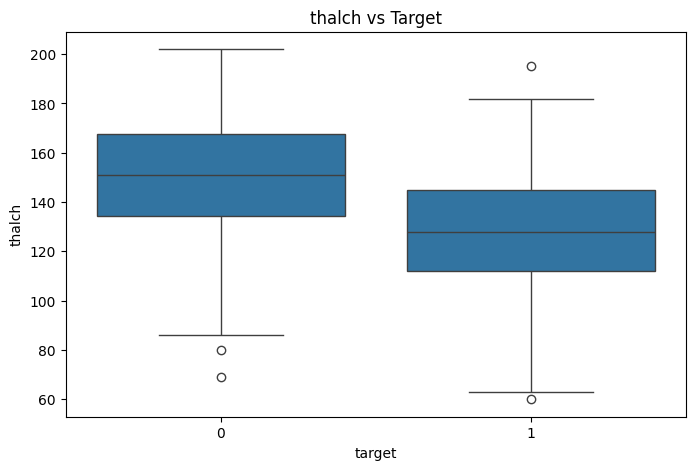

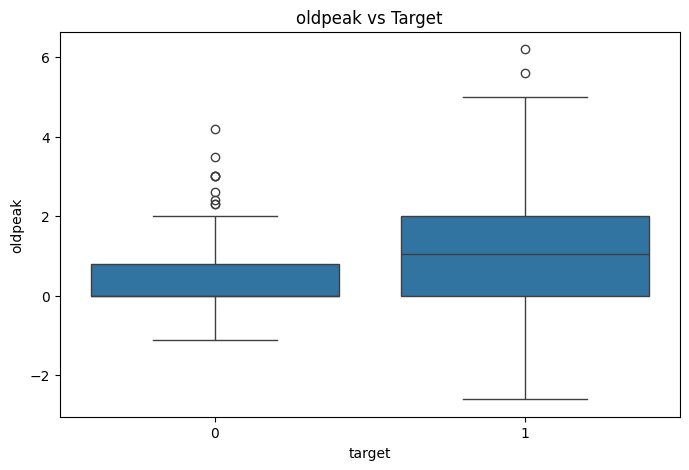

...

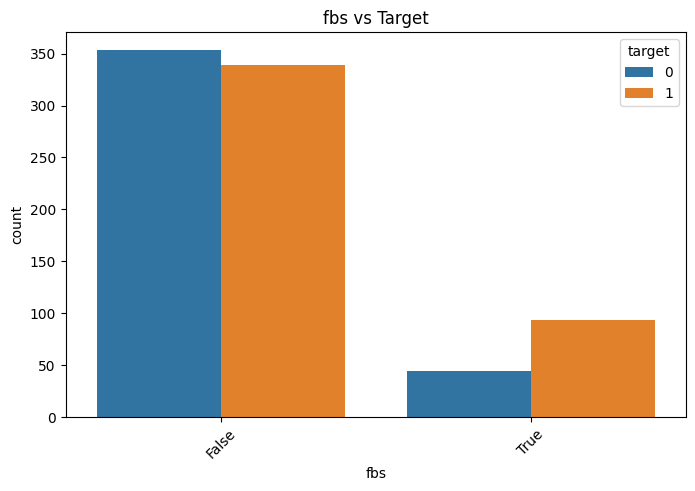

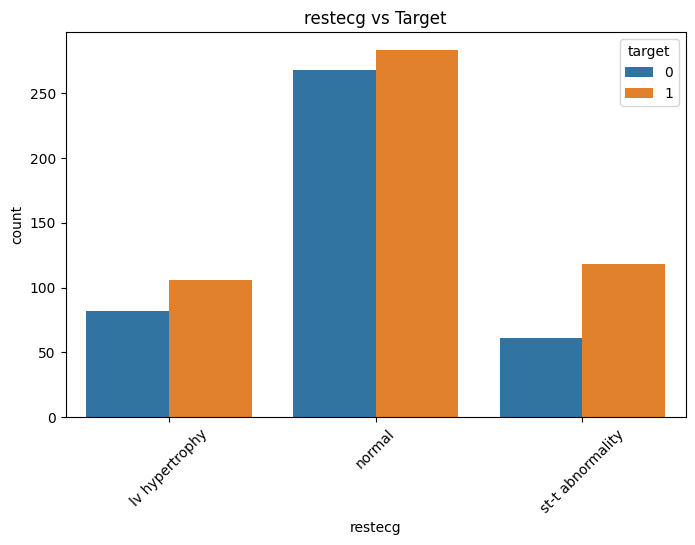

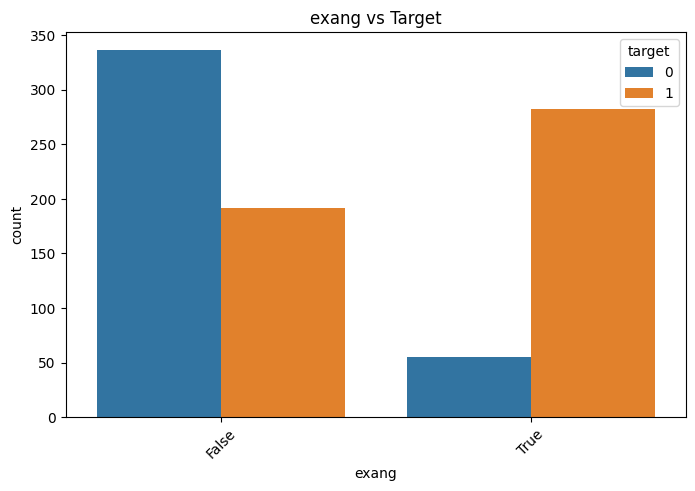

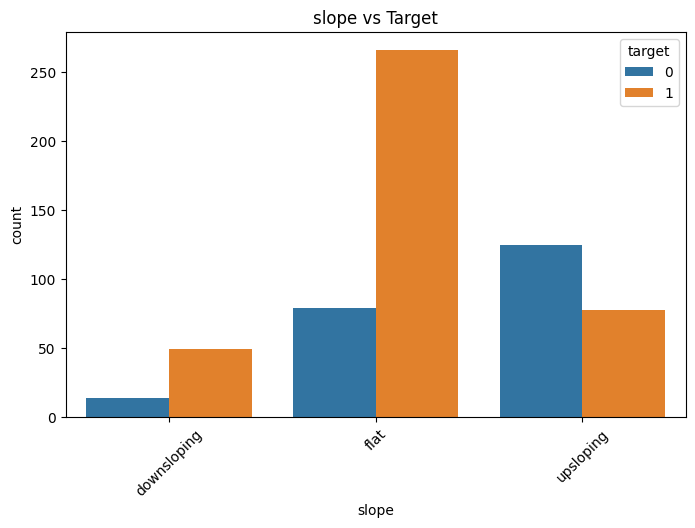

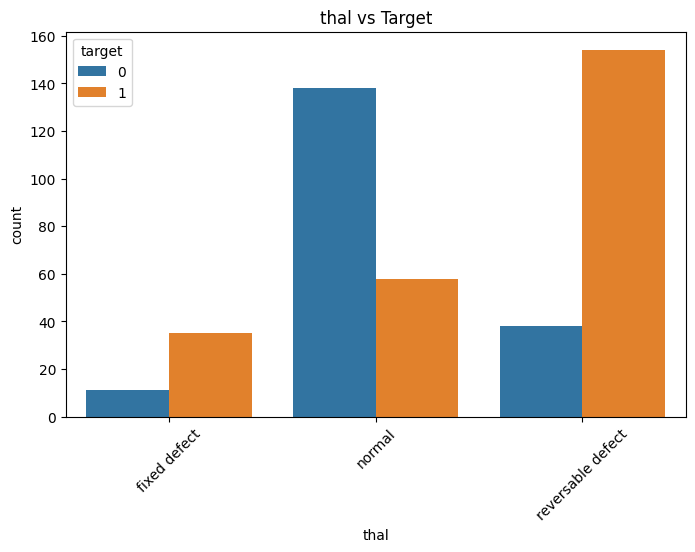

In [ ]:
# Relationships with the target
df_temp = Data.copy()
for col in numeric_cols:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x='target', y=col, data=df_temp)
    plt.title(f'{col} vs Target')
    plt.show()
for col in categorical_cols:
    plt.figure(figsize=(8, 5))
    sns.countplot(x=col, hue='target', data=df_temp)
    plt.title(f'{col} vs Target')
    plt.xticks(rotation=45)
    plt.show()

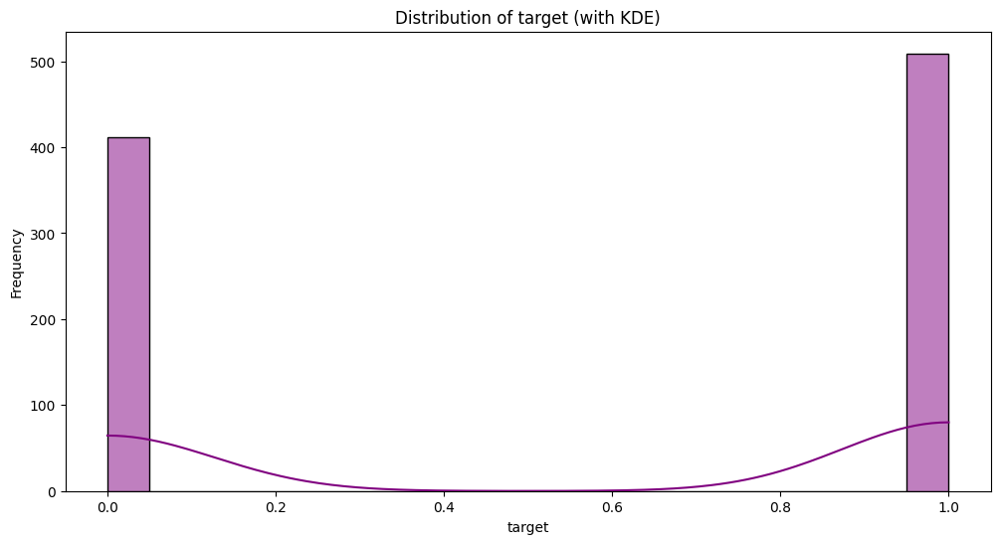

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(Data['target'], kde=True, color='purple', bins=20)
plt.title('Distribution of target (with KDE)')
plt.xlabel('target')
plt.ylabel('Frequency')
plt.show()

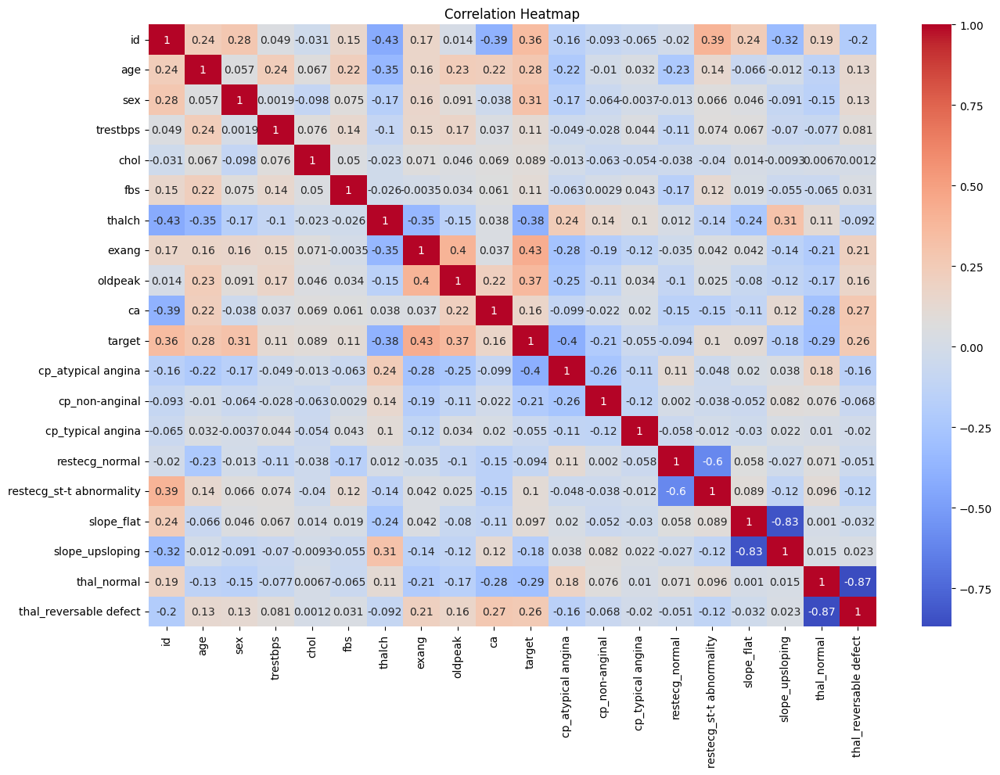

In [ ]:
# correlation
numeric_data = Data.select_dtypes(include=np.number)

plt.figure(figsize=(15, 10))
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


# Data clenning & Data preprocessing

In [ ]:
# preprocessing Data
def preprocessing_functions():
    global Data
    numeric_cols = ['age', 'trestbps', 'chol', 'thalch', 'oldpeak', 'ca']
    categorical_cols = ['fbs', 'exang', 'slope', 'thal', 'cp', 'restecg']
    Data['trestbps'] = Data['trestbps'].replace(0, np.nan)
    Data['chol'] = Data['chol'].replace(0, np.nan)
    for col in numeric_cols:
        Data[col] = Data[col].fillna(Data[col].median())
    for col in categorical_cols:
        mode_value = Data[col].mode()
        if not mode_value.empty:
            Data[col] = Data[col].fillna(mode_value[0])
    # Convert binary columns
    Data['sex'] = Data['sex'].map({'Male': 1, 'Female': 0, 'male': 1, 'female': 0}).fillna(0).astype(int)
    Data['fbs'] = Data['fbs'].map({True: 1, False: 0, 'True': 1, 'False': 0, np.nan: 0}).astype(int)
    Data['exang'] = Data['exang'].map({True: 1, False: 0, 'True': 1, 'False': 0, np.nan: 0}).astype(int)

    # One-Hot Encoding
    one_hot_encoder = OneHotEncoder(sparse_output=False, drop='first')
    encoded_data = one_hot_encoder.fit_transform(Data[['cp', 'restecg', 'slope', 'thal']])
    encoded_columns = one_hot_encoder.get_feature_names_out(['cp', 'restecg', 'slope', 'thal'])
    encoded_df = pd.DataFrame(encoded_data, columns=encoded_columns, index=Data.index)
    Data.drop(['cp', 'restecg', 'slope', 'thal'], axis=1, inplace=True)
    Data = pd.concat([Data, encoded_df], axis=1)
preprocessing_functions()

In [ ]:
Data

,id,age,sex,dataset,trestbps,chol,fbs,thalch,exang,oldpeak,...,target,cp_atypical angina,cp_non-anginal,cp_typical angina,restecg_normal,restecg_st-t abnormality,slope_flat,slope_upsloping,thal_normal,thal_reversable defect
0,1,63,1,Cleveland,145.0,233.0,1,150.0,0,2.3,...,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,67,1,Cleveland,160.0,286.0,0,108.0,1,1.5,...,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,3,67,1,Cleveland,120.0,229.0,0,129.0,1,2.6,...,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,4,37,1,Cleveland,130.0,250.0,0,187.0,0,3.5,...,0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,5,41,0,Cleveland,130.0,204.0,0,172.0,0,1.4,...,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,916,54,0,VA Long Beach,127.0,333.0,1,154.0,0,0.0,...,1,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
916,917,62,1,VA Long Beach,130.0,139.0,0,140.0,0,0.5,...,0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0
917,918,55,1,VA Long Beach,122.0,223.0,1,100.0,0,0.0,...,1,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
918,919,58,1,VA Long Beach,130.0,385.0,1,140.0,0,0.5,...,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


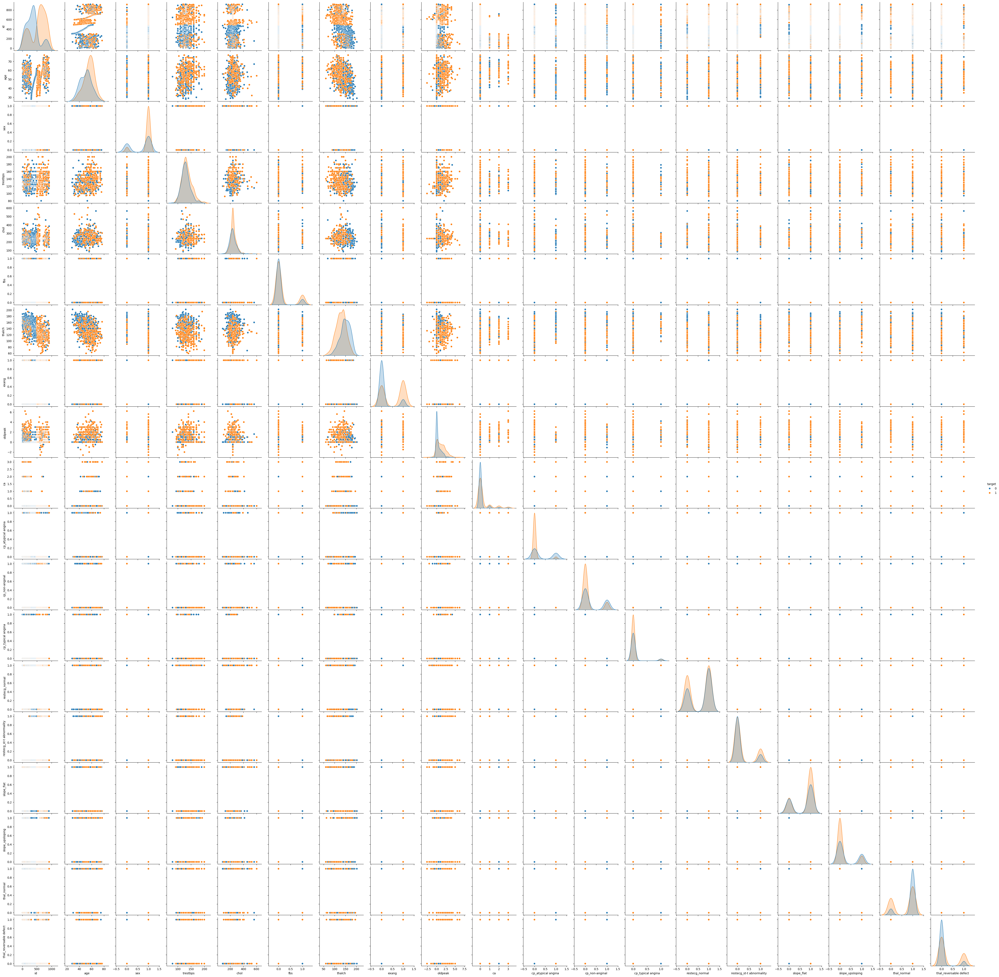

In [ ]:
sns.pairplot(Data, hue='target')
plt.show()

# Spliting Dataset

In [ ]:
from imblearn.over_sampling import SMOTE
# spliting
X = Data.drop(['target', 'id', 'dataset'], axis=1)
y = Data['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# SMOTE
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# scaler
scaler = StandardScaler()
X_train_scaler = scaler.fit_transform(X_train_res)
X_test_scaler = scaler.transform(X_test)

# Train Model

In [ ]:
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
def MODEL_TRAIN():
    model = Sequential([
        Dense(128, activation='relu', input_shape=(X_train_scaler.shape[1],), kernel_regularizer=l2(0.01)),
        Dropout(0.3),
        Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
        Dropout(0.3),
        Dense(32, activation='relu', kernel_regularizer=l2(0.01)),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    history = model.fit(X_train_scaler,
                        y_train_res,
                        epochs=100,
                        batch_size=32,
                        validation_split=0.2,
                        callbacks=[early_stopping])
    return model
MODEL = MODEL_TRAIN()

# Evaluate Model
test_loss, test_accuracy = MODEL.evaluate(X_test_scaler, y_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Save Model
MODEL.save('heart_disease_model.h5')
import joblib
joblib.dump(scaler, 'scaler.pkl')

Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - accuracy: 0.4759 - loss: 2.2447 - val_accuracy: 0.8313 - val_loss: 1.9988
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6584 - loss: 1.9612 - val_accuracy: 0.8125 - val_loss: 1.7250
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.7598 - loss: 1.6831 - val_accuracy: 0.8313 - val_loss: 1.4616
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8123 - loss: 1.4725 - val_accuracy: 0.8687 - val_loss: 1.2537
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7725 - loss: 1.3300 - val_accuracy: 0.8750 - val_loss: 1.1229
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8078 - loss: 1.1952 - val_accuracy: 0.8687 - val_loss: 1.0182
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8051 - loss: 1.0714 - val_accuracy: 0.8938 - val_loss: 0.9139
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8316 - loss: 0.9688 - val_accuracy: 0.8938

Test Accuracy: 0.8315


['scaler.pkl']

# Metrics Test

In [ ]:
y_pred = MODEL.predict(X_test_scaler)
y_pred[:10]

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step 


array([[0.02364573],
       [0.05752492],
       [0.9341975 ],
       [0.96777165],
       [0.8374676 ],
       [0.09785873],
       [0.063154  ],
       [0.97104865],
       [0.81427556],
       [0.16412821]], dtype=float32)

In [ ]:
y_test[:10]

,target
319,0
377,0
538,1
296,1
531,1
70,0
493,1
664,1
796,1
30,0


In [ ]:
from sklearn.metrics import classification_report
y_pred = MODEL.predict(X_test_scaler)
report = classification_report(y_test, y_pred.round())
print(report)

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
              precision    recall  f1-score   support

           0       0.78      0.83      0.80        75
           1       0.88      0.83      0.85       109

    accuracy                           0.83       184
   macro avg       0.82      0.83      0.83       184
weighted avg       0.83      0.83      0.83       184



Text(70.72222222222221, 0.5, 'True Labels')

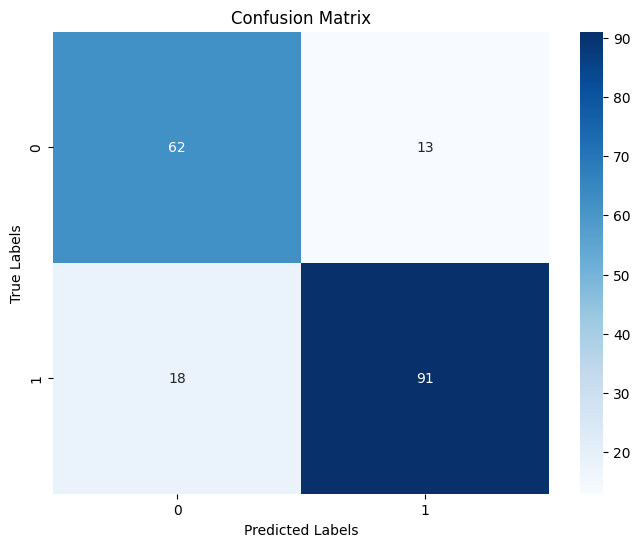

In [ ]:
from sklearn.metrics import confusion_matrix

matrix = confusion_matrix(y_test, y_pred.round())
plt.figure(figsize=(8, 6))
sns.heatmap(matrix, annot=True , fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

# Building a simple application for gradio





In [ ]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.1/54.1 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.9/322.9 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 3.8 MB/s eta 0:00:00


In [ ]:
import gradio as gr
from tensorflow.keras.models import load_model
import numpy as np
import joblib

# Load Model
scaler = joblib.load('scaler.pkl')
model = load_model('heart_disease_model.h5')

# Prediction function
def predict_heart_disease(*features):
    input_data = np.array([features])
    input_scaled = scaler.transform(input_data)
    prediction = model.predict(input_scaled)[0][0]
    return f"Possibility of infection : {prediction:.2f} ({'injured' if prediction > 0.5 else 'Healthy'})"

# feature names
feature_names = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs',
                 'restecg', 'thalch', 'exang', 'oldpeak', 'slope', 'thal']

# Gradio interface
inputs = [gr.Number(label=name) for name in feature_names]

interface = gr.Interface(
    fn=predict_heart_disease,
    inputs=inputs,
    outputs="text",
    title="Heart Disease Prediction Model",
    description="Enter the required values ​​to predict the heart condition (Affected / Healthy)."
)

interface.launch()

It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://c545b4d35bd8b26cb4.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)



# *Thank you for checking out this notebook! ❤️❤️*